# Compute first embeddings

In [1]:
import sys
sys.path.append('..')

from src import Processing

In [2]:
DATASET_PART_FOLDER = r"C:\Users\Ася\Desktop\Папки\Учёба\project_FotoMoto\8.06(2)MOTORING_25.06.22 JPG"

In [3]:
processor = Processing(DATASET_PART_FOLDER)

In [4]:
%%time
img_path_to_moto_embs = processor.process_all_images(processes=4, first_n_images=100)

CPU times: total: 2.02 s
Wall time: 2min 56s


In [5]:
len(img_path_to_moto_embs)

100

# t-SNE visualization

In [6]:
all_embs = []

for img_path, embs in img_path_to_moto_embs.items():
    all_embs.extend(embs)
    
img_paths = []
moto_masks = []

for img_path, embs in img_path_to_moto_embs.items():
    img_paths.extend([img_path] * len(embs))

In [7]:
from sklearn.manifold import TSNE
import numpy as np

X = np.array(all_embs)
X_embedded = TSNE(random_state=1, n_iter=15000, metric="euclidean").fit_transform(X)

x = X_embedded[:, 0]
y = X_embedded[:, 1]

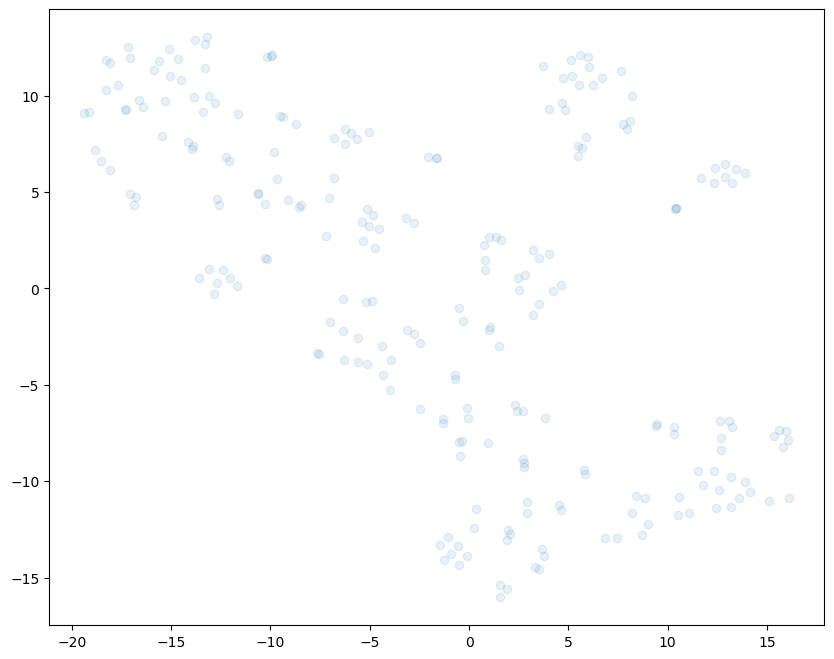

In [8]:
import matplotlib.pyplot as plt

%matplotlib inline

fig, ax = plt.subplots(figsize=(10, 8))
# Make points translucent so we can visually identify regions with a high density of overlapping points
ax.scatter(x, y, alpha=.1);

# Clustering with K-Means

## Choose parameter k

In [9]:
# !pip install threadpoolctl==3.0

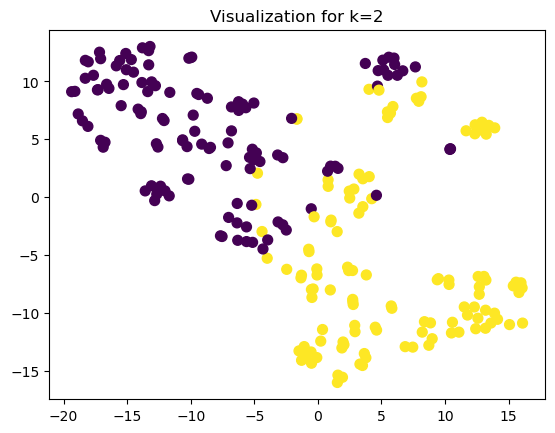

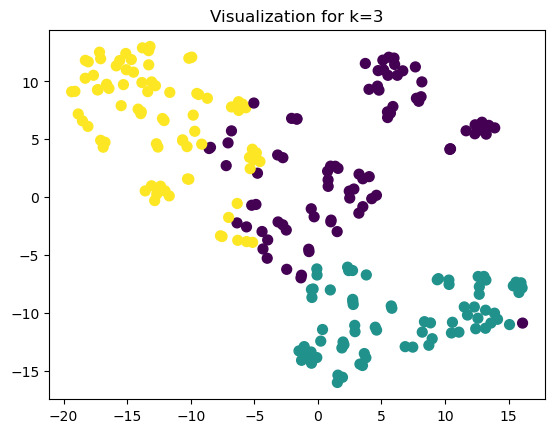

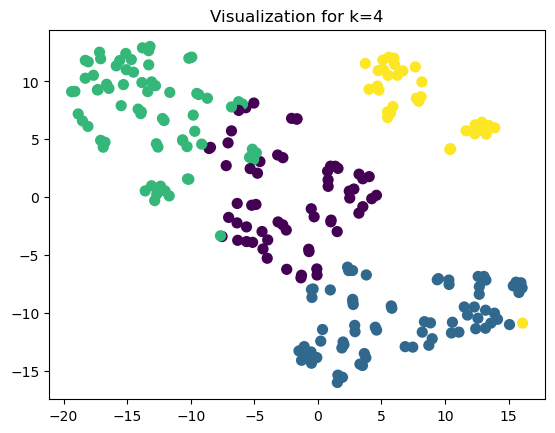

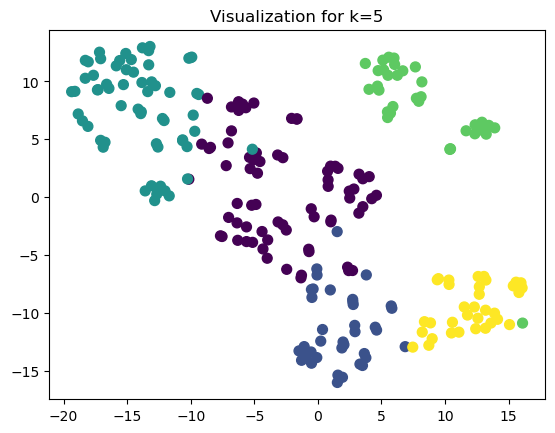

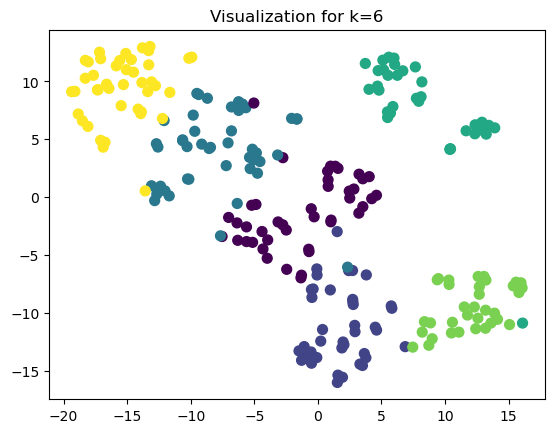

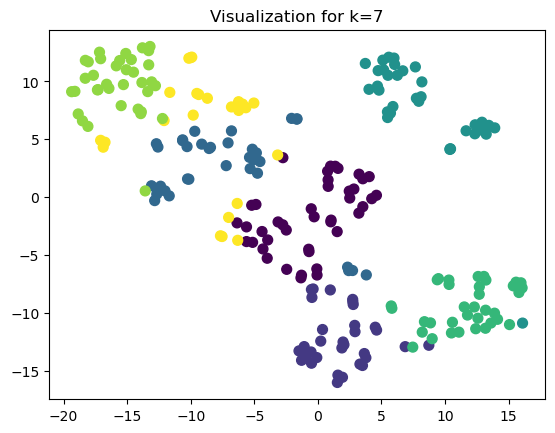

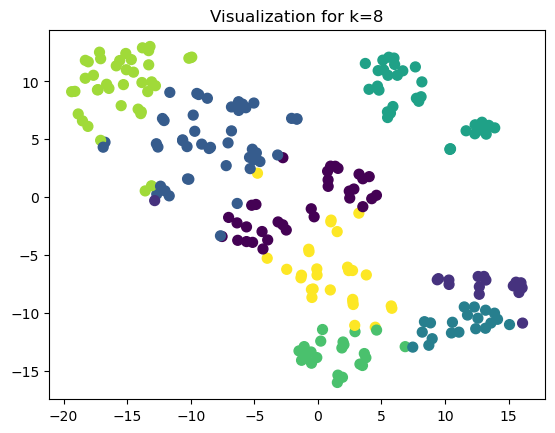

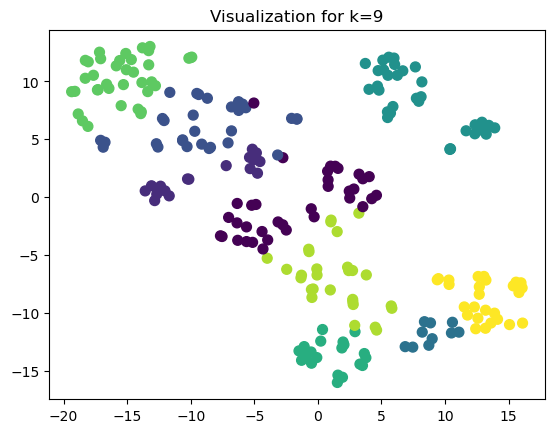

In [10]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

k_values = list(range(2, 10))
silhouettes = []
sses = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init="auto")
    kmeans.fit(X)
    y_kmeans = kmeans.predict(X)
    
    plt.title(f'Visualization for k={k}')
    plt.scatter(x, y, c=y_kmeans, s=50, cmap='viridis')
    plt.show()
    
    silhouette = silhouette_score(X, y_kmeans)
    silhouettes.append(silhouette)
    sses.append(kmeans.inertia_)


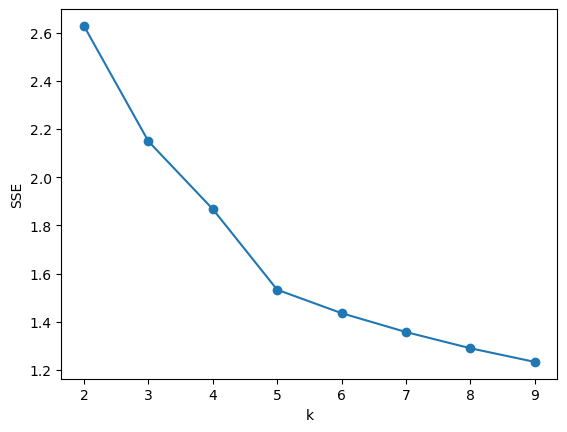

In [11]:
plt.xlabel('k')
plt.ylabel('SSE')
plt.plot(k_values, sses, 'o-')
plt.show()

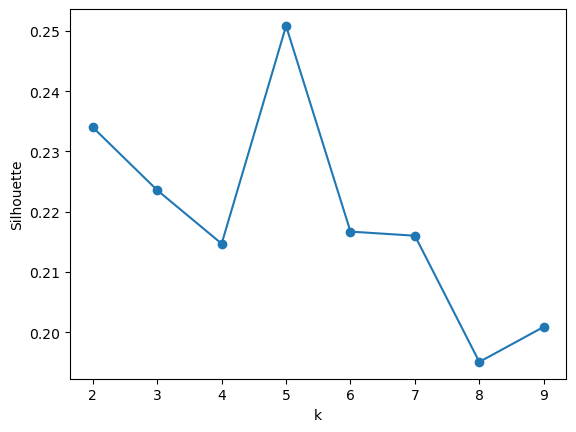

In [12]:
plt.xlabel('k')
plt.ylabel('Silhouette')
plt.plot(k_values, silhouettes, 'o-')
plt.show()

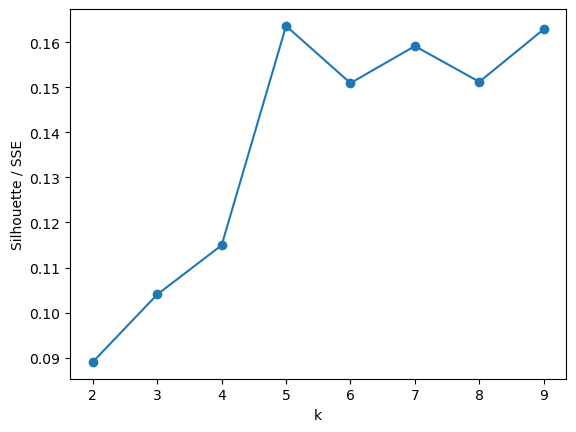

In [13]:
divided_metrics = [silhouette / sse for silhouette, sse in zip(silhouettes, sses)]
plt.xlabel('k')
plt.ylabel('Silhouette / SSE')
plt.plot(k_values, divided_metrics, 'o-')
plt.show()

In [14]:
divided_metrics

[0.08902496521571217,
 0.10400330394878043,
 0.1149478205502148,
 0.16366666423102666,
 0.15096315053224243,
 0.15918539175190144,
 0.15124809701278205,
 0.16292461057035731]

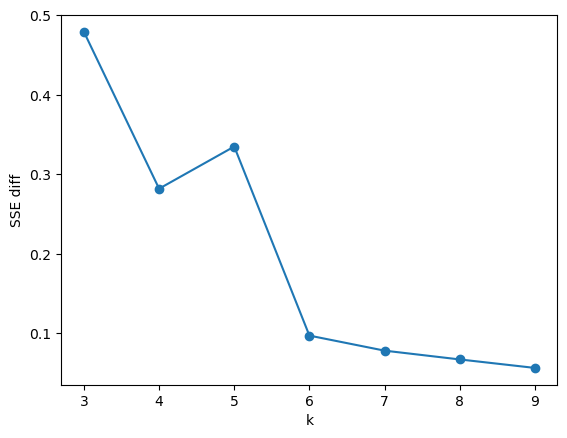

In [15]:
plt.xlabel('k')
plt.ylabel('SSE diff')
plt.plot(k_values[1:], np.array(sses[:-1]) - np.array(sses[1:]), 'o-')
plt.show()

**The most suitable** clustering quality metric **for selecting k** is the calculation of the **silhouette**:
1. only a numerical estimate is sufficient (unlike, for example, the elbow method, where you need to visually evaluate the SSE plot)
2. This quality metric internally uses the properties of both compactness and separability of clusters

In [16]:
k_min = k_values[0]
k_val = np.argmax(np.array(silhouettes)) + k_min

k_val

5

## Clustering results visualization

In [17]:
img_paths = []

for img_path, embs in img_path_to_moto_embs.items():
    img_paths.extend([img_path] * len(embs))

In [18]:
assert len(X) == len(img_paths)

In [19]:
kmeans = KMeans(n_clusters=k_val, random_state=0, n_init="auto")
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

In [20]:
import random
import cv2

def show_cluster_examples_imgs(
    cluster_id: int, y_kmeans, img_paths,
    max_examples: int = 12, seed: int = 0,
    cols: int = 3, img_size_on_plot: int = 5,
):
    random.seed(seed)
    
    cluster_elems_ids = np.argwhere(y_kmeans == cluster_id).reshape(-1).tolist()
    print(f'Cluster={cluster_id} elems count: {len(cluster_elems_ids)}')
    
    rows = max_examples // cols

    fig = plt.figure(
        figsize=(img_size_on_plot * rows, img_size_on_plot * cols),
    )
    fig.suptitle(f'Examples of cluster#{cluster_id}')
    
    if len(cluster_elems_ids):
        examples_count = min(len(cluster_elems_ids), max_examples)
        examples_ids = random.sample(cluster_elems_ids, examples_count)
        
        for i, idx in enumerate(examples_ids):
            img_path = img_paths[idx]
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            fig.add_subplot(rows, cols, i+1)
            
            plt.axis('off')
            plt.imshow(img)
        
        plt.show()
          

Cluster=0 elems count: 71


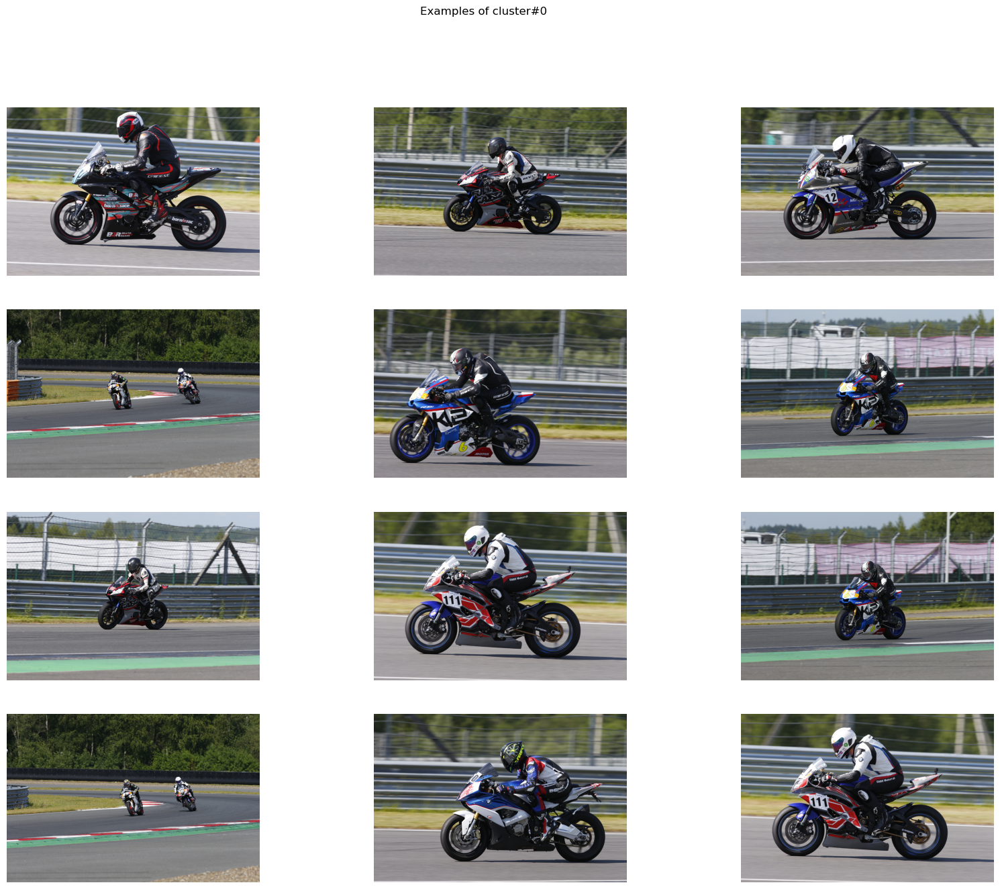

Cluster=1 elems count: 37


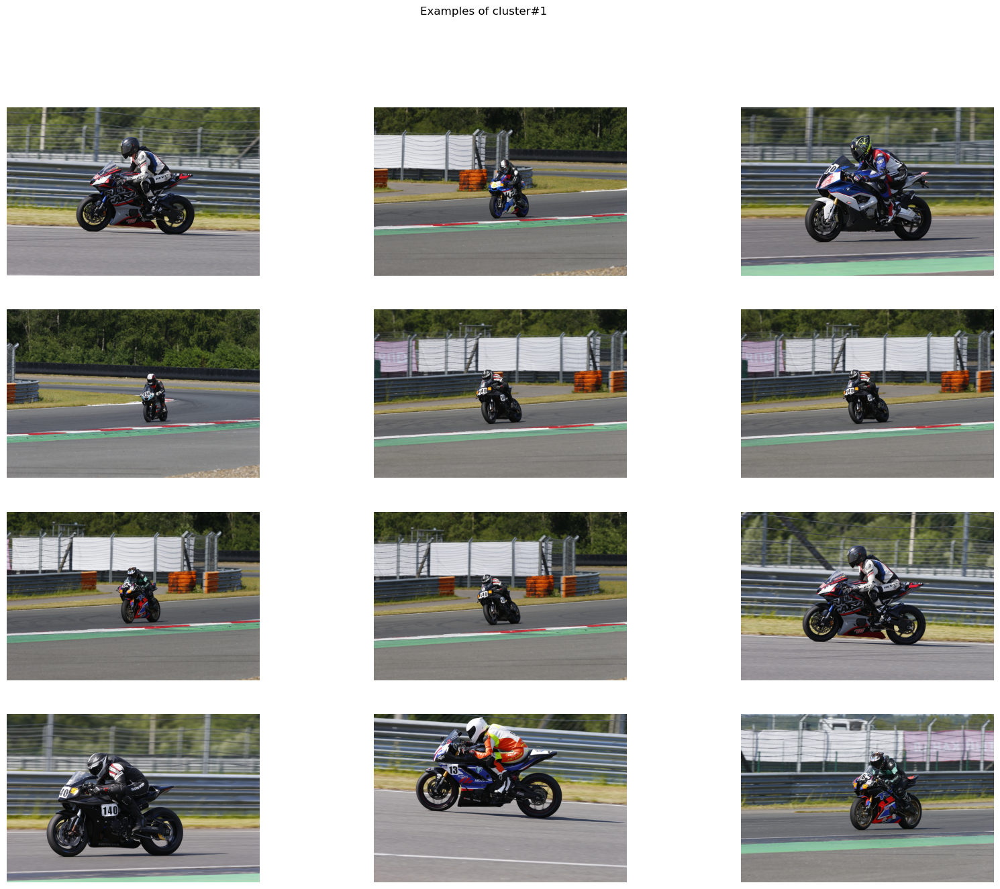

Cluster=2 elems count: 61


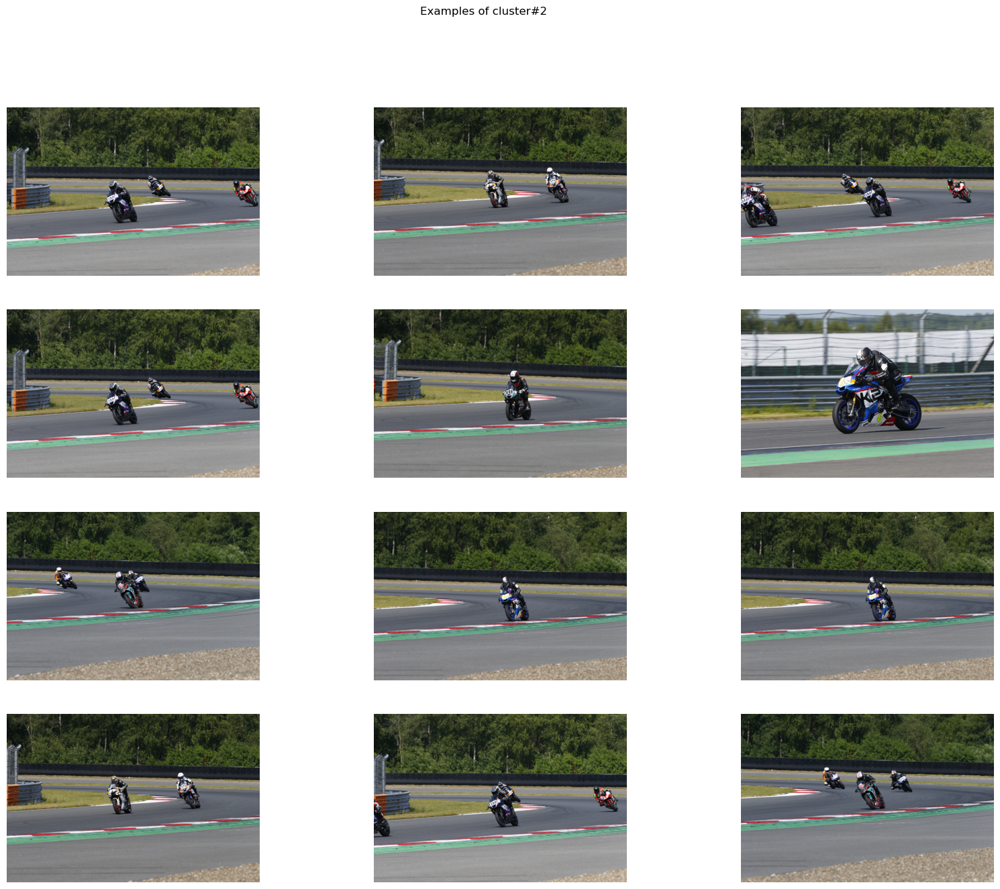

Cluster=3 elems count: 34


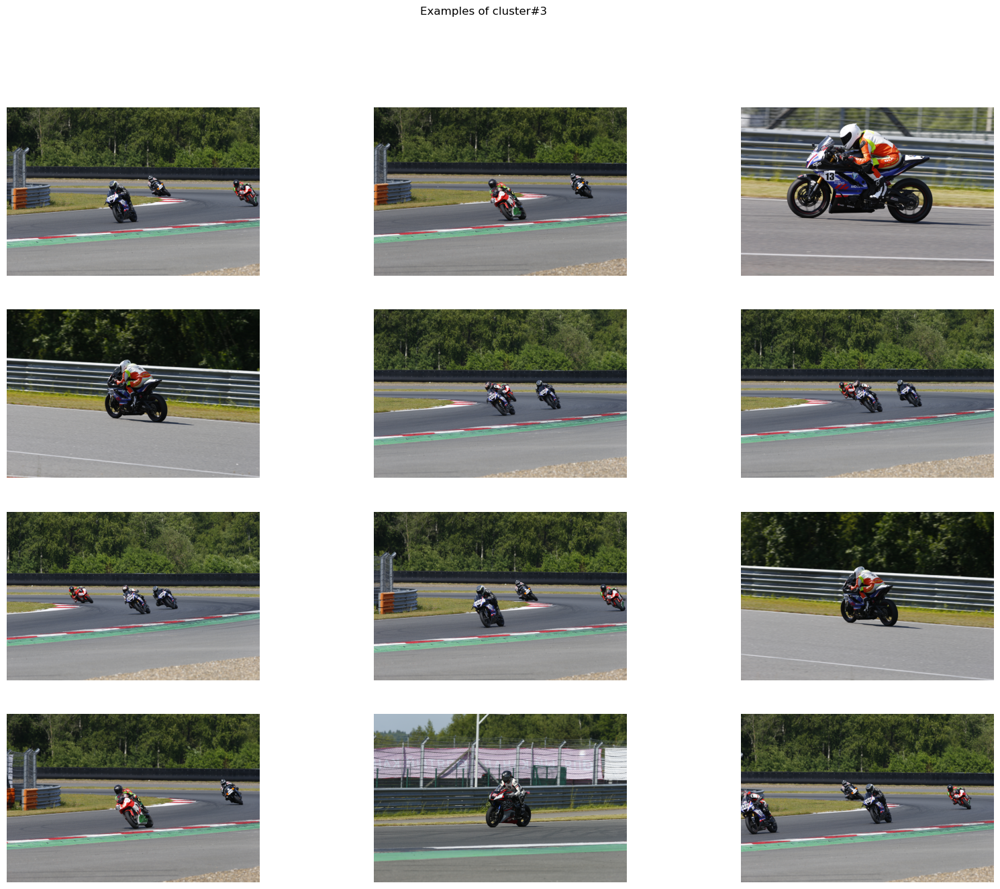

Cluster=4 elems count: 34


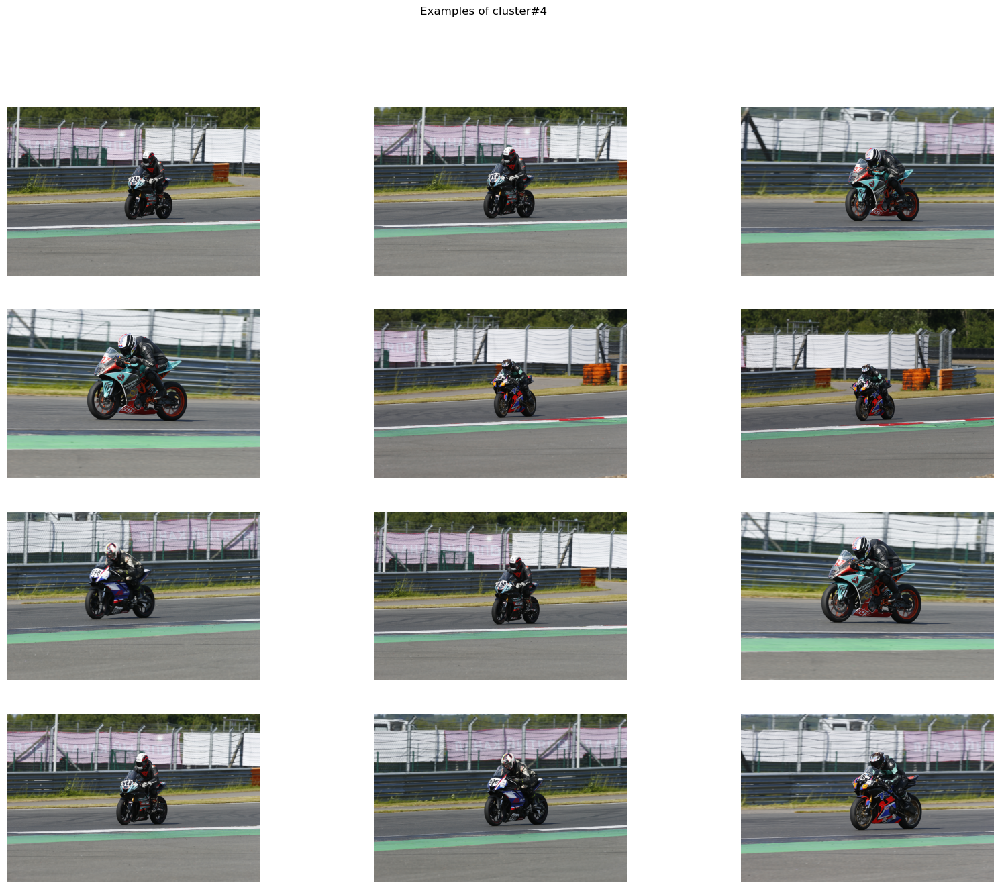

In [21]:
for cluster_id in range(k_val):
    show_cluster_examples_imgs(cluster_id, y_kmeans, img_paths)